<a href="https://colab.research.google.com/github/NNUG2019/KlasyfikacjaPatentow/blob/master/Copy_of_Projekt_neuronowe.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import pandas as pd
import json 
import requests
import matplotlib.pyplot as plt
import numpy as np
from tensorflow import keras

In [0]:
#dane = pd.read_json('/content/drive/My Drive/Colab Notebooks/dane.json', orient='column')  # Poznanie struktury json

In [0]:
'''dane.columns=['title', 'date_published', 'description', 'classification', 'inventors',
       'abstract', 'claims']'''

In [0]:
#res = dict((k, d[k]) for k in ['main'] if k in d) # Jak na razie niepotrzebne
#res

In [0]:
with open("/content/drive/My Drive/Colab Notebooks/dane.json", 'r') as jason: ################ kod glowny #########################
    patents = json.load(jason)

In [0]:
patents.columns=['title', 'date_published', 'description', 'classification', 'inventors',
       'abstract', 'claims']

AttributeError: ignored

In [0]:
patents[:1]

[{'abstract': '\\r\\r\\rCROSS-REFERENCE TO RELATED APPLICATIONS\\rThis application is a divisional of application Ser. No. 09/855,262, filed May 15, 2001, now U.S. Pat. No. 6,530,126.\\r\\r\\r\\r\\rBACKGROUND OF THE INVENTION\\r1. Field of Invention\\rThe present invention relates generally to a low thread force two piece cable tie. More particularly, the invention relates to a locking device for such a cable tie that has an integral protruding tang serving as an anchoring device.\\r2. Description of Related Art\\rPlastic cable ties having metal locking device inserts are well known in the art. Examples of such include U.S. Pat. No. 3,457,598 to Mariani and U.S. Pat. No. 5,517,727 to Bernard et al.\\rCable ties of this type include a metal locking device partially embedded at an angle within a strap accepting channel of a cable tie head. The metal locking device is situated at an angle that allows insertion of a cable tie strap in an insertion direction, but allows for engagement of th

In [0]:
abstract_key='description'

In [0]:
i=0
a=0
b=0
ilosc_slow=[]
for p in patents:
    #print(i,distro['classification']['main'][0:4], len(distro['abstract'].split()) ) #Pierwsze cztery litery klasyfikacji. Liczba słów w abstract.
    ilosc_slow.append(len(p[abstract_key].split()) )
    if (p['classification']['main'][0:4] == 'A61M'):
        a=a+1
    elif(p['classification']['main'][0:4] == 'B65D'):
        b=b+1
    i=i+1

In [0]:
#AD.EDA
#1.
ilosc=len(patents) #Ilość patentów 11433.
print("Ilość patentów równa się", ilosc)

#2.
#dane[:0] # JSON składa się z 7 kolumn. 

#3.
a+b - len(patents) #Zostały zliczone wszytkie główne kody 4 cyfrowe poprawnie.
print("Liczebność klas:", a, ',', b,". Klasy nie są równoliczne") #Klasy 'A61M' jest więcej o 565. (Klasy nie są równoliczne).

Ilość patentów równa się 11433
Liczebność klas: 5434 , 5999 . Klasy nie są równoliczne


In [0]:
print(ilosc_slow) #Ilość słów w abstrakcie patentu

[1465, 1098, 953, 3444, 460, 701, 359, 459, 1878, 895, 1116, 423, 811, 443, 790, 964, 508, 2006, 1144, 1285, 681, 833, 1197, 2363, 3070, 990, 1482, 3558, 659, 819, 3320, 644, 1316, 638, 277, 3596, 1405, 1088, 1451, 1068, 1013, 1199, 678, 1953, 3162, 2929, 1095, 2411, 693, 1046, 1254, 862, 646, 1673, 972, 1164, 3687, 1132, 3312, 1181, 928, 1976, 1282, 540, 1592, 575, 1922, 1247, 1372, 769, 401, 961, 1378, 946, 1485, 1710, 1561, 977, 758, 1543, 61, 717, 1955, 578, 694, 1121, 216, 1372, 801, 1144, 1067, 1498, 544, 596, 1297, 1047, 1154, 1117, 1092, 816, 500, 335, 1013, 628, 2719, 862, 1016, 1938, 1745, 2541, 1318, 335, 731, 4813, 494, 2388, 2037, 1178, 1705, 1364, 218, 516, 1464, 1485, 973, 898, 1333, 2337, 1851, 1498, 1434, 1871, 1589, 1238, 842, 1105, 3181, 4151, 1115, 791, 736, 1288, 1745, 957, 1221, 775, 816, 884, 713, 3508, 1744, 1316, 588, 895, 425, 1546, 1946, 788, 1021, 813, 2545, 576, 1623, 1394, 1357, 1976, 1416, 655, 998, 4336, 287, 2409, 1173, 529, 878, 526, 884, 751, 2001, 21

In [0]:
sr=np.mean(ilosc_slow)
med=np.median(ilosc_slow)

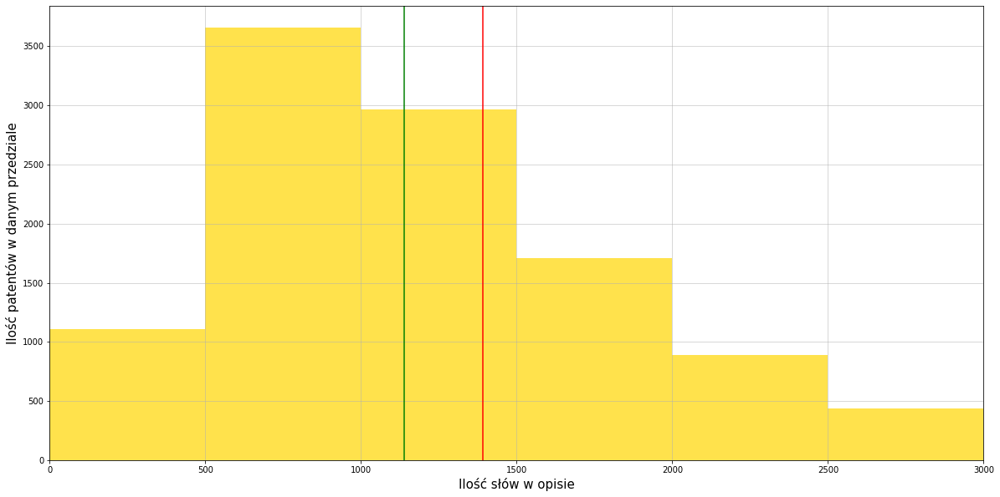

In [0]:
plt.figure(figsize=(20,10))
plt.hist(ilosc_slow, ls='-', bins=[0, 500, 1000, 1500, 2000, 2500, 3000], color='gold',alpha=0.7)
plt.xlabel("Ilość słów w opisie", fontsize=15)
plt.ylabel("Ilość patentów w danym przedziale", fontsize=15)
plt.axis(option='on', col='red')
plt.xlim(0,3000)
plt.axvline(x=sr, c='red')
plt.axvline(x=med, c='green')
plt.grid(alpha=100)
plt.show()

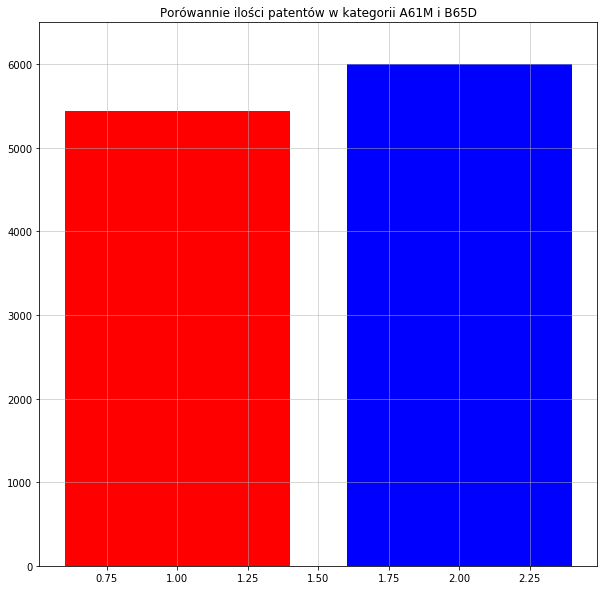

In [0]:
plt.figure(figsize=(10,10))
plt.ylim((0,6500))
plt.grid(alpha=100)
plt.bar((1,2),(5434, 5999), color=('red','blue'))
plt.title("Porówannie ilości patentów w kategorii A61M i B65D")
plt.show()

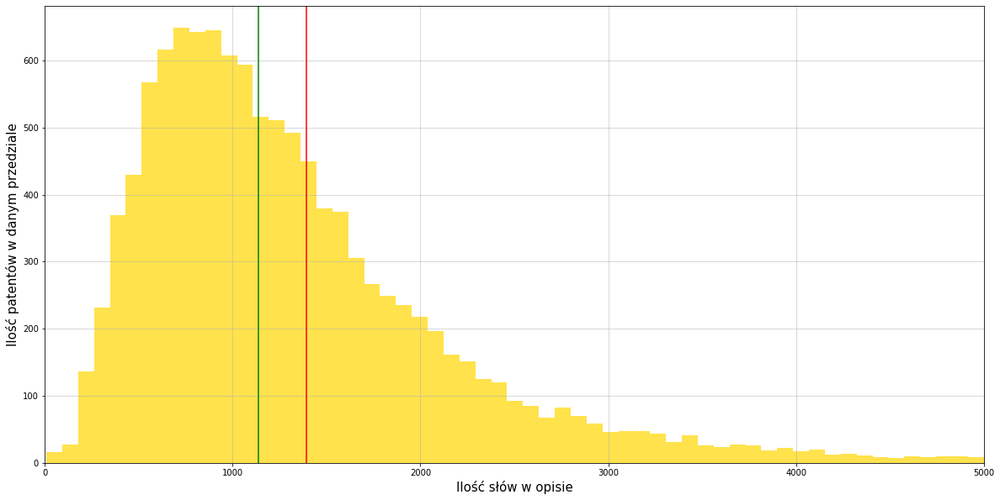

In [0]:
plt.figure(figsize=(20,10))
plt.hist(ilosc_slow, ls='-', color='gold', alpha=0.7, bins='auto')
plt.xlabel("Ilość słów w opisie", fontsize=15)
plt.ylabel("Ilość patentów w danym przedziale", fontsize=15)
plt.axis(option='on', col='red')
plt.xlim(0,5000)
plt.axvline(x=sr, c='red')
plt.axvline(x=med, c='green')
plt.grid(alpha=100)

plt.show()

In [0]:
#z[i] = distro['classification']['main'][0:4] # Trzeba zrobic wartości 'z' jako wektor 4 liter klasyfikacji, zliczyć liczność grup i ile wgl jest tych grup

In [0]:
r=[] #Stworzenie biblioteki wszytskich wystepujących słów
for i in range(ilosc):
  fit_text=[patents[i][abstract_key]]
  r=r+fit_text
r

['  BACKGROUND OF THE INVENTION 1. Field of Invention The present invention relates generally to a low thread force two piece cable tie. More particularly, the invention relates to a locking device for such a cable tie that has an integral protruding tang serving as an anchoring device. 2. Description of Related Art Plastic cable ties having metal locking device inserts are well known in the art. Examples of such include U.S. Pat. No. 3,457,598 to Mariani and U.S. Pat. No. 5,517,727 to Bernard et al. Cable ties of this type include a metal locking device partially embedded at an angle within a strap accepting channel of a cable tie head. The metal locking device is situated at an angle that allows insertion of a cable tie strap in an insertion direction, but allows for engagement of the locking device with the strap when it is pulled in a removing direction to prevent removal. The metal locking device of such cable ties is in the form of a cantilevered beam that is fixed at one end and

In [0]:
from keras.preprocessing.text import Tokenizer

In [0]:
t  = Tokenizer()
#fit_text=[]
#for i in patents:
  #fit_text.append([patents[i][abstract_key]])
#return fit_text
t.fit_on_texts(r) #Biblioteka słów na liczby.

#fit_on_texts fits on sentences when list of sentences is passed to fit_on_texts() function. 
#ie - fit_on_texts( [ sent1, sent2, sent3,....sentN ] )

#Similarly, list of sentences/single sentence in a list must be passed into texts_to_sequences.
test_text1 = "The earth is an great place live"
test_text2 = "The is my program"
sequences = t.texts_to_sequences([test_text1, test_text2])

print('sequences : ',sequences,'\n')

print('word_index : ',t.word_index)
#texts_to_sequences() returns list of list. ie - [ [] ]

sequences :  [[1, 8889, 6, 11, 1478, 390, 5968], [1, 6, 3088, 3419]] 

word_index :  {'the': 1, 'of': 2, 'a': 3, 'to': 4, 'and': 5, 'is': 6, 'in': 7, 'for': 8, 'or': 9, 'be': 10, 'an': 11, 'with': 12, 'invention': 13, 'that': 14, 'which': 15, 'as': 16, 'are': 17, 'from': 18, 'by': 19, 'at': 20, 'may': 21, 'such': 22, 'it': 23, 'can': 24, 'on': 25, 'this': 26, 'container': 27, 'one': 28, 'present': 29, 'end': 30, 'portion': 31, 'into': 32, 'device': 33, 'first': 34, 'catheter': 35, 'has': 36, 'second': 37, 'other': 38, 'when': 39, 'body': 40, 'through': 41, 'having': 42, 'blood': 43, 'patient': 44, 'member': 45, 'also': 46, 'not': 47, 'provide': 48, 'fluid': 49, 'needle': 50, 'used': 51, 'pressure': 52, 'use': 53, 'surface': 54, 'have': 55, 'another': 56, 'wall': 57, 'material': 58, 'between': 59, 'no': 60, 'more': 61, 'within': 62, 'side': 63, 'means': 64, 'flow': 65, 'further': 66, 'includes': 67, 'tube': 68, 'system': 69, 'so': 70, 's': 71, 'distal': 72, 'each': 73, 'opening': 74, 'l

In [0]:
t  = Tokenizer()
t.fit_on_texts(r)

#fit_on_texts fits on sentences when list of sentences is passed to fit_on_texts() function. 
#ie - fit_on_texts( [ sent1, sent2, sent3,....sentN ] )

#Similarly, list of sentences/single sentence in a list must be passed into texts_to_sequences.
sequences = t.texts_to_sequences([r[1]])

print('sequences : ',sequences,'\n')
print('word_index : ',t.word_index)
#texts_to_sequences() returns list of list. ie - [ [] ]


sequences :  [[1, 29, 13, 116, 112, 4, 3, 1722, 1188, 5, 149, 4, 3, 1722, 1188, 2, 1, 10143, 3320, 531, 1722, 3289, 17, 2332, 815, 4, 154, 1, 392, 59, 3, 1722, 9, 481, 5, 3, 384, 845, 9, 3036, 1, 3289, 9531, 20, 75, 3, 31, 2, 1, 97, 1505, 2, 3, 1722, 208, 139, 3, 845, 5, 17, 1001, 4, 9924, 365, 134, 4, 4177, 3, 627, 1723, 442, 3337, 240, 4, 154, 1, 1722, 4, 1, 845, 1722, 3289, 2, 1, 10143, 3320, 531, 17, 46, 159, 5, 966, 247, 17, 156, 8, 1294, 7, 78, 71, 86, 849, 151, 9449, 8213, 5, 89, 9635, 11512, 1, 3535, 2, 1744, 3320, 3289, 2215, 275, 379, 125, 38, 521, 2, 1722, 1188, 181, 14, 2, 80, 112, 1600, 125, 3, 596, 2, 1722, 2336, 5, 2, 1902, 262, 950, 2931, 106, 38, 1188, 521, 22, 16, 418, 2418, 10260, 171, 9, 935, 2312, 9, 1849, 2076, 171, 7516, 316, 1744, 3320, 3289, 2332, 471, 11, 97, 112, 823, 699, 859, 31, 8, 6166, 3, 450, 31, 2, 1, 97, 1505, 2, 3, 1722, 5, 42, 1010, 325, 1652, 627, 1400, 5, 244, 2115, 4, 111, 1010, 6406, 859, 325, 5, 3, 1744, 3320, 174, 59, 1, 887, 6406, 859, 325, 4

In [0]:
len(r[1])


6727